# Machine Learning

## TME 02 - Estimation de densité

**Ben KABONGO**, M1 DAC, Sorbonne Université, 2022-2023

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pickle

L’objectif de ce TME est de prendre en main les algorithmes d’estimation de densité : estimation par histogramme et par méthode à noyaux. 

Nous utiliserons deux classes (dont les prototypes sont donnés dans le code fourni) - **Histogramme** et **KernelDensity** - qui héritent de la classe (abstraite) **Density**. 

La fonction **fit(x)** permet d’apprendre l’estimateur sur les données passées en argument et la fonction **predict(data)** permet de prédire pour chaque point de data la densité.

Complétez la classe **Density** avec une méthode **score(data)** qui permet de renvoyer la *log-vraisemblance* des données data de l’estimateur. 

Pour gérer les points correspondant à une densité nulle, il est usuel d’ajouter une très petite valeur (1e−10 par exemple) à chaque vraisemblance avant de passer au log (pourquoi ?).

`La fonction log n'étant pas définie en 0, l'ajout d'une constante très faible permet d'éviter de calculer du log(0).`

In [2]:
class Density(object):
    
    def fit(self,data):
        pass
    
    def predict(self,data):
        pass
    
    def score(self,data):
        return np.log(self.predict(data) + 1e-10).sum()

## Données : API Google Places, Points d’intérêt de Paris

Téléchargez l’archive des données sur le site de l’ue. Elle contient un dictionnaire avec des informations sur différents types de points d’intérêt (POI) de Paris. Chaque clé du dictionnaire correspond à un type de POI (restaurant, bar, . . . ) et la valeur associée est un dictionnaire avec l’identifiant google map comme clé, et les informations sur le POI : les coordonnées GPS, sa notation, son nom, ses types, le niveau des prix.
Le code fourni vous permet de charger la matrice des coordonnées GPS et de visualiser les données.
Affichez sur la carte différents POIs, les restaurants et les bars par exemple.

In [3]:
POI_FILENAME = "data/poi-paris.pkl"
parismap = mpimg.imread('data/paris-48.806-2.23--48.916-2.48.jpg')
## coordonnees GPS de la carte
xmin, xmax = 2.23, 2.48  # coord_x min et max
ymin, ymax = 48.806, 48.916  # coord_y min et max
coords = [xmin, xmax, ymin, ymax]

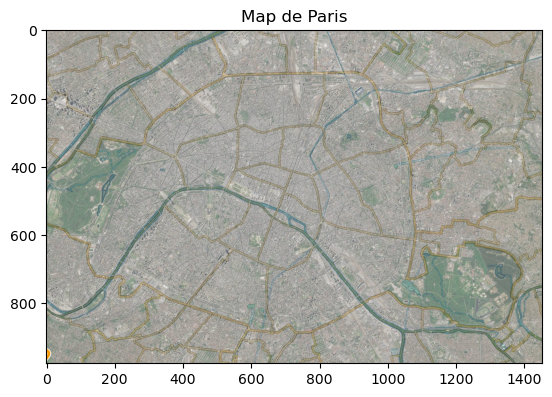

In [4]:
plt.title('Map de Paris')
plt.imshow(parismap)
plt.show()

In [5]:
with open(POI_FILENAME, 'rb') as file:
    dictionary = pickle.load(file)
pois = list(dictionary.keys())
print('Les points d intérêts :', *pois, sep='\n\t')

Les points d intérêts :
	furniture_store
	laundry
	bakery
	cafe
	home_goods_store
	clothing_store
	atm
	lodging
	night_club
	convenience_store
	restaurant
	bar


In [6]:
def get_density2D(f,data,steps=100):
    """ Calcule la densité en chaque case d'une grille steps x steps dont 
    les bornes sont calculées à partir du min/max de data. Renvoie la grille 
    estimée et la discrétisation sur chaque axe.
    """
    xmin, xmax = data[:,0].min(), data[:,0].max()
    ymin, ymax = data[:,1].min(), data[:,1].max()
    xlin,ylin = np.linspace(xmin,xmax,steps),np.linspace(ymin,ymax,steps)
    xx, yy = np.meshgrid(xlin,ylin)
    grid = np.c_[xx.ravel(), yy.ravel()]
    res = f.predict(grid).reshape(steps, steps)
    return res, xlin, ylin

In [7]:
def show_density(f, data, steps=100, log=False):
    """ Dessine la densité f et ses courbes de niveau sur une grille 2D calculée 
    à partir de data, avec un pas de discrétisation de steps. Le paramètre log 
    permet d'afficher la log densité plutôt que la densité brute
    """
    res, xlin, ylin = get_density2D(f, data, steps)
    xx, yy = np.meshgrid(xlin, ylin)
    plt.figure()
    show_img()
    if log:
        res = np.log(res+1e-10)
    plt.scatter(data[:, 0], data[:, 1], alpha=0.8, s=3)
    show_img(res)
    plt.colorbar()
    plt.contour(xx, yy, res, 20)

In [8]:
def show_img(img=parismap):
    """ Affiche une matrice ou une image selon les coordonnées de la carte de Paris.
    """
    origin = "lower" if len(img.shape) == 2 else "upper"
    alpha = 0.3 if len(img.shape) == 2 else 1.
    plt.imshow(img, extent=coords, aspect=1.5, origin=origin, alpha=alpha)
    ## extent pour controler l'echelle du plan

In [9]:
def load_poi(typepoi,fn=POI_FILENAME):
    """ Dictionaire POI, clé : type de POI, valeur : dictionnaire des POIs de ce type : (id_POI, [coordonnées, note, nom, type, prix])
    
    Liste des POIs : furniture_store, laundry, bakery, cafe, home_goods_store, 
    clothing_store, atm, lodging, night_club, convenience_store, restaurant, bar
    """
    poidata = pickle.load(open(fn, "rb"))
    data = np.array([[v[1][0][1],v[1][0][0]] for v in sorted(poidata[typepoi].items())])
    note = np.array([v[1][1] for v in sorted(poidata[typepoi].items())])
    return data,note

## II. Méthode par histogramme

Codez les méthodes de la classe **Histogramme**. Dans l’idéal, votre classe devra gérer des données de dimension quelconque. 

Pour les besoins du TME, nous n’utiliserons que des données 2D, vous pouvez donc vous contenter de méthodes qui fonctionnent en 2D. 

Le paramètre *steps* du constructeur doit permettre de spécifier le nombre d’intervalles de discrétisation de chaque dimension

**Indications** :
- Pour estimer l’histogramme, vous pouvez utiliser **np.histogramdd** ;
- Pour la prédiction, il n’y a pas de fonction numpy qui permet de connaître pour un point donné les indices correspondant dans l’histogramme. Vous pouvez passer par une fonction intermédiaire **to_bin(x)** qui calcule ces indices à partir du pas de discrétisation et des bornes min et max de l’histogramme.

In [10]:
class Histogramme(Density):
    
    def __init__(self,steps=10):
        Density.__init__(self)
        self.steps = steps
        self.hist = None
        self.edges = None
        
    def fit(self, X):
        # apprend l'histogramme de la densité sur X
        self.hist, self.edges = np.histogramdd(X, bins=self.steps)
        self.hist = self.hist / len(X)
    
    def predict(self, X):
        # retourne la densité associée à chaque point de X
        def to_bin(x):
            index = []
            for i, xi in enumerate(x):
                where = np.where(self.edges[i] < xi)[0]
                j = where[-1] if len(where) > 0 else None
                if j is not None and j >= self.steps: j = None
                index.append(j)
            return tuple(index)
        
        pred = []
        for x in X:
            index = to_bin(x)
            #print(index)
            density = 0 if None in index else self.hist[index]
            pred.append(density)
        
        return np.array(pred)

Estimez la loi de densité géographique d’un type de POIs par la méthode des histogrammes pour un pas de discrétisation donné.

Vérifiez que vous avez bien une loi de densité : la fonction **get_density2D(f,data,steps)** permet d’évaluer un estimateur f d’un problème en 2 dimensions sur une grille dont les bornes sont définies par les minimums et maximums de data sur chaque dimension et où chaque dimension est divisée en steps intervalles. Elle renvoie l’estimation en chaque point de la grille, la discrétisation utilisée selon le premier axe et selon le second axe. Que doit vérifier votre estimateur sur cette grille s’il n’y a pas d’erreur ?

Pour quelques valeurs de pas de discrétisation de l’histogramme, affichez les densités obtenues à l’aide de la fonction **show_density(f,data,steps,log)**. Quelle discrétisation semble la meilleure ?

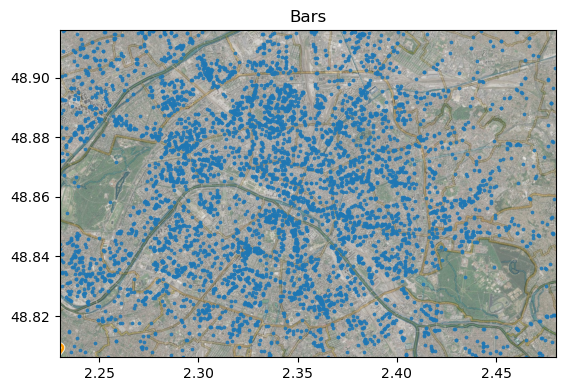

In [11]:
data_bar, notes = load_poi("bar")

show_img()
plt.scatter(data_bar[:,0],data_bar[:,1],alpha=0.8,s=3)
plt.title('Bars')
plt.show()

In [12]:
h = Histogramme(10)
h.fit(data_bar)
h.hist.sum()

1.0

In [13]:
get_density2D(h, data_bar, 10)[0].sum()

0.8840016366612112

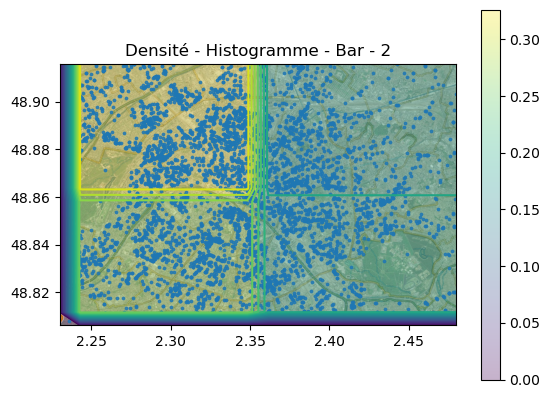

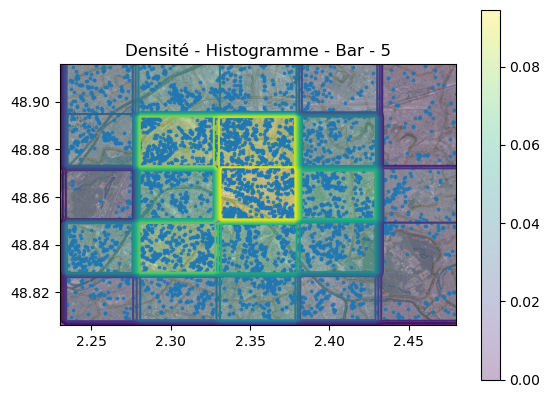

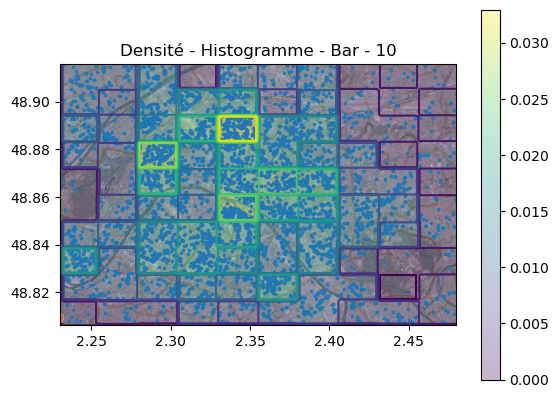

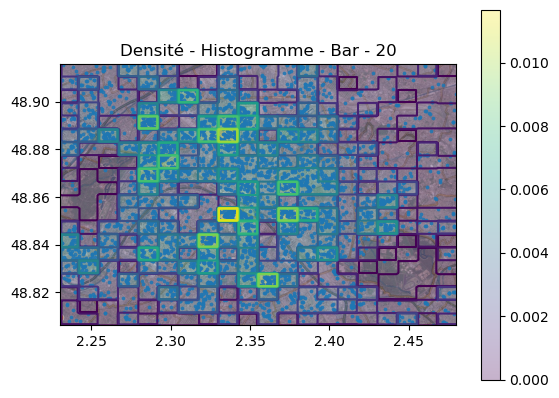

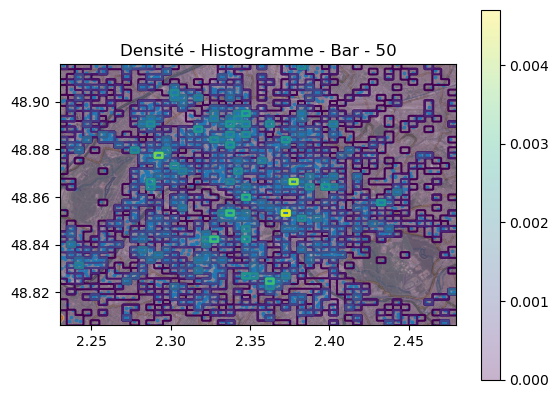

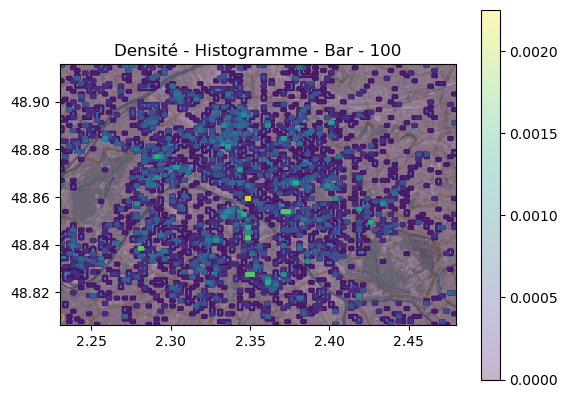

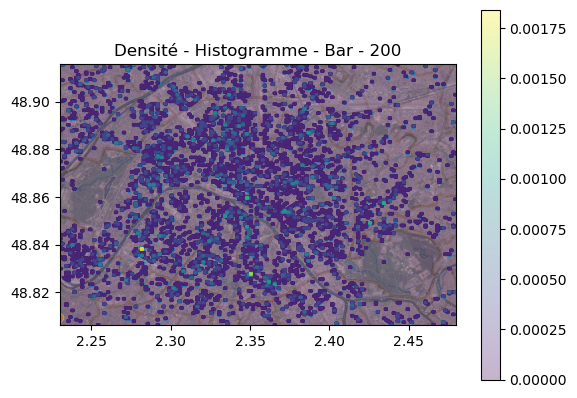

In [14]:
for steps in [2, 5, 10, 20, 50, 100, 200]:
    h = Histogramme(steps)
    h.fit(data_bar)
    show_density(h, data_bar, steps * 10)
    plt.title(f'Densité - Histogramme - Bar - {steps}')

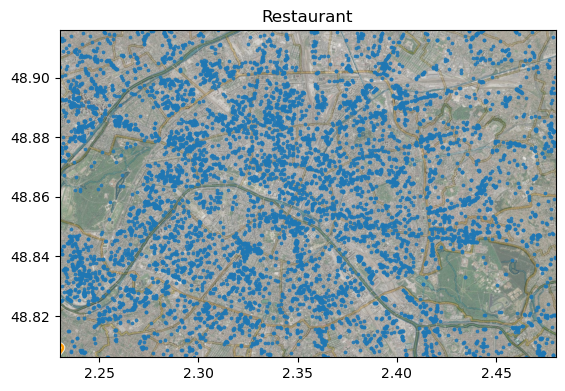

In [15]:
data_resto, notes = load_poi("restaurant")

show_img()
plt.scatter(data_resto[:,0],data_resto[:,1],alpha=0.8,s=3)
plt.title('Restaurant')
plt.show()

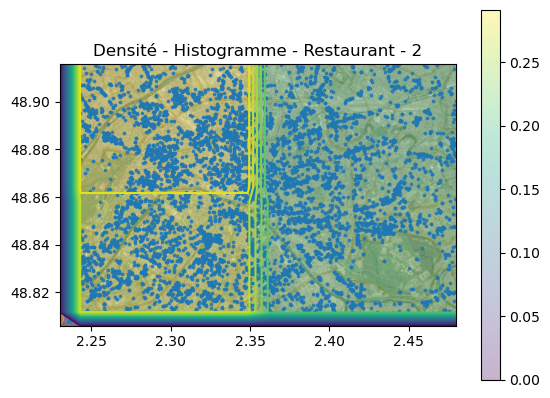

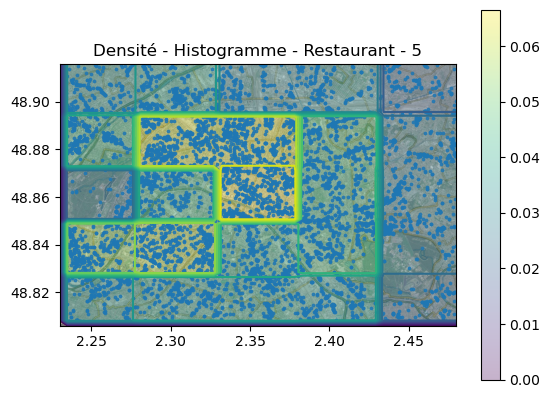

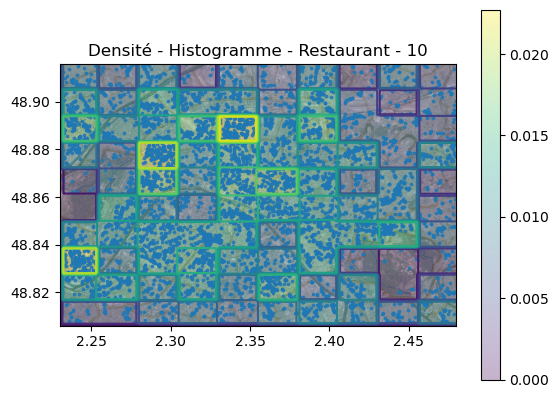

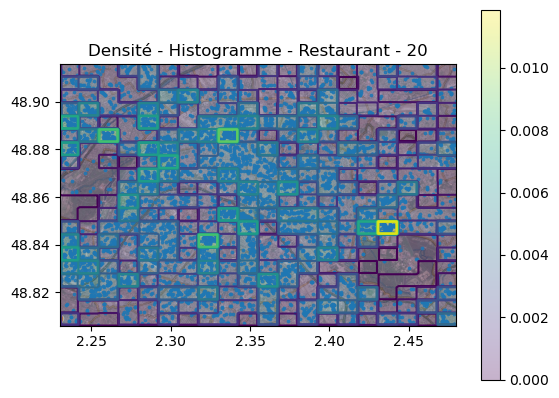

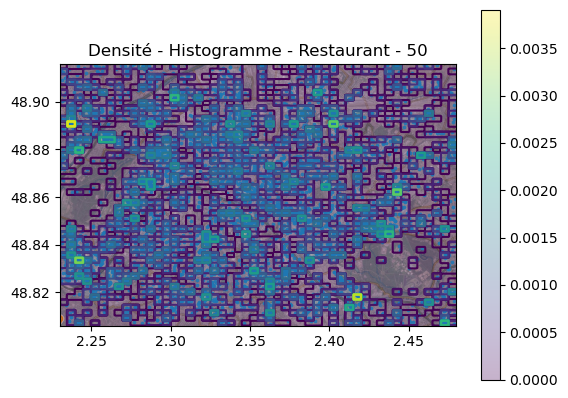

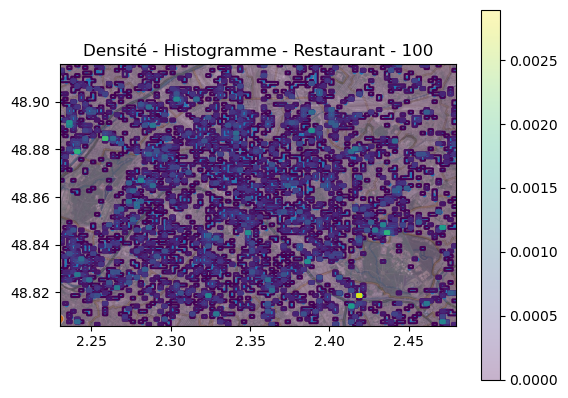

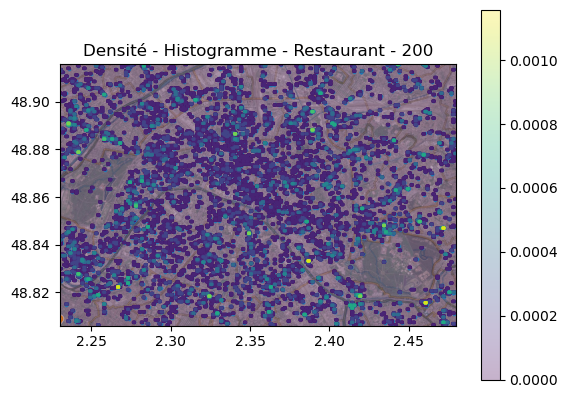

In [16]:
for steps in [2, 5, 10, 20, 50, 100, 200]:
    h = Histogramme(steps)
    h.fit(data_resto)
    show_density(h, data_resto, steps * 10)
    plt.title(f'Densité - Histogramme - Restaurant - {steps}')

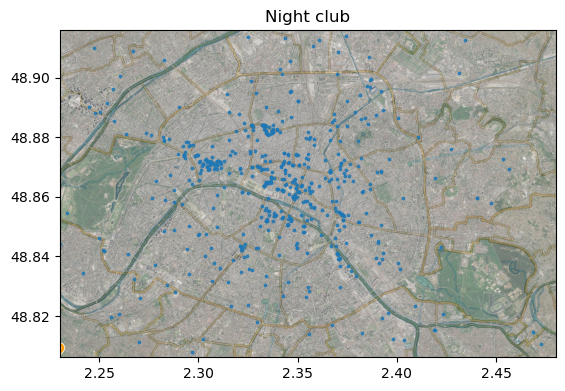

In [17]:
data_night, notes = load_poi("night_club")

show_img()
plt.scatter(data_night[:,0],data_night[:,1],alpha=0.8,s=3)
plt.title('Night club')
plt.show()

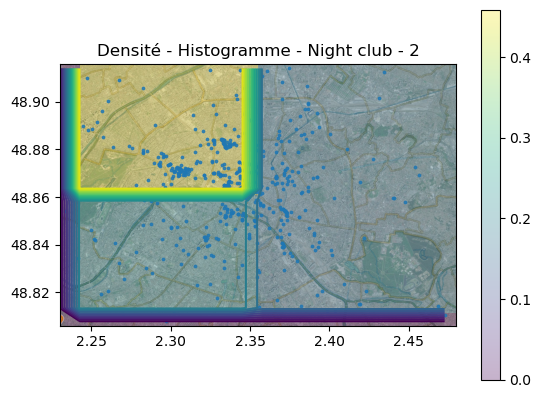

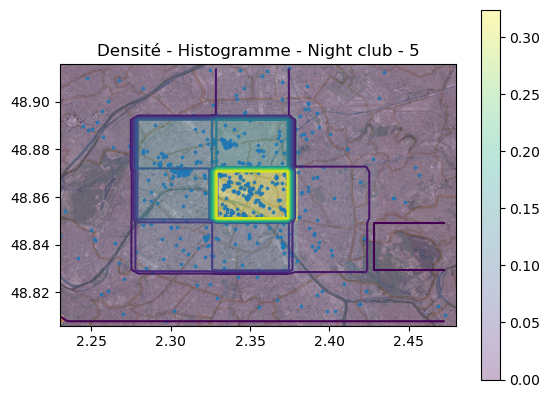

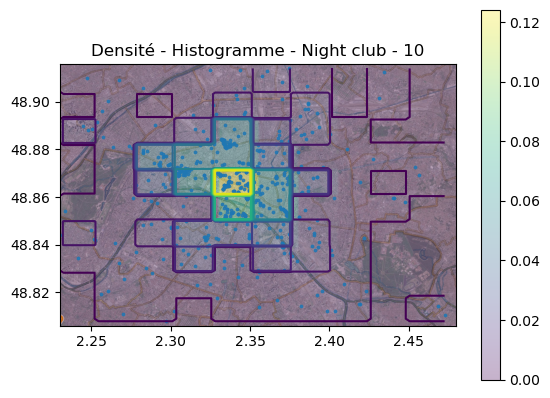

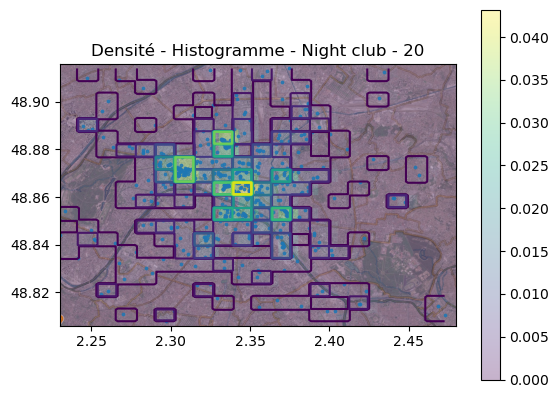

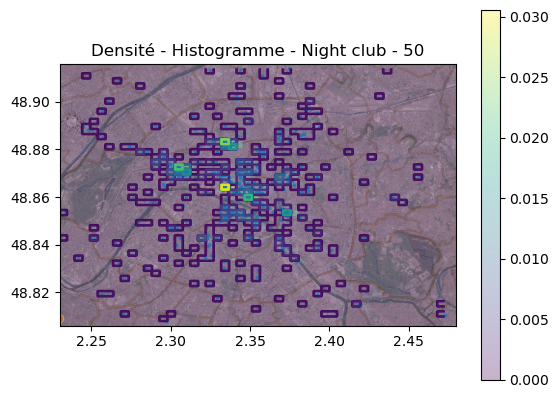

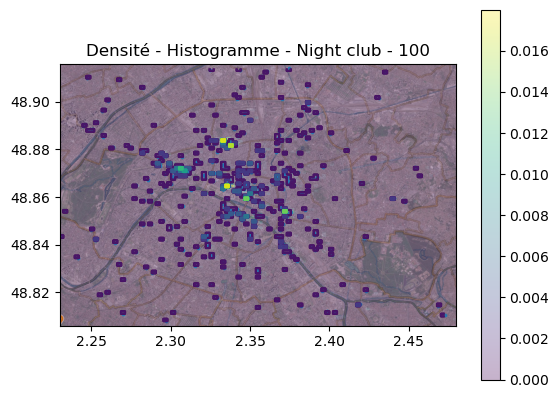

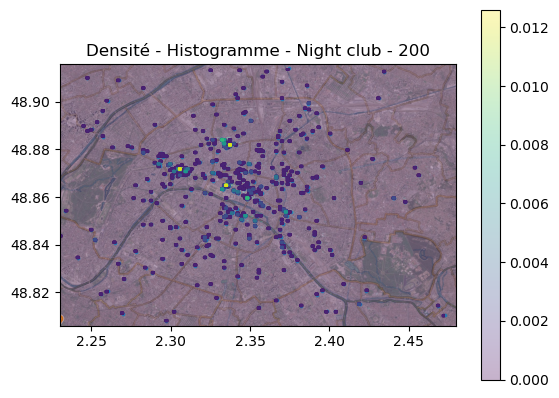

In [18]:
for steps in [2, 5, 10, 20, 50, 100, 200]:
    h = Histogramme(steps)
    h.fit(data_night)
    show_density(h, data_night, steps * 10)
    plt.title(f'Densité - Histogramme - Night club - {steps}')

In [19]:
h = Histogramme(steps)
h.fit(data_resto)
h.score(data_resto)

-57799.822415652765

Utilisez un split en ensembles d’apprentissage et de test (ou une validation croisée) afin d’estimer la vraisemblance en apprentissage et en test. Quelle est le meilleur hyper-paramètre empirique pour le pas de discrétisation ?

In [20]:
np.random.seed(0)

In [21]:
def cross_validation(data, steps=[], size=.2, cv=5, log=False):
    N = len(data)

    mean_scores = []
    std_scores = []
    
    for step in steps:
        if log: print('Step :', step)
        
        test_scores = []
        
        for i in range(cv):
                
            index = np.arange(0, N)
            np.random.shuffle(index)
            
            test_zize = int(N * size)
            test = index[:test_zize]
            train = index[test_zize:]
        
            h = Histogramme(step)
            h.fit( data[train] )
            
            test_scores.append( h.score( data[test] ) )
        
        mean = np.mean(test_scores)
        std = np.std(test_scores)
        
        if log:
            print('\tMean :', mean)
            print('\tStd :', std)
        
        mean_scores.append(mean)
        std_scores.append(std)
        
    return mean_scores, std_scores

In [22]:
steps = [2, 5, 10, 20, 50, 100, 200]
mean_scores, std_scores = cross_validation(data_bar, steps, log=True)

print('\nMeilleure valeur de steps :', steps[np.argmin(mean_scores)])

Step : 2
	Mean : -1340.9838217577721
	Std : 10.77830186257693
Step : 5
	Mean : -3022.9498028314397
	Std : 36.1250909897183
Step : 10
	Mean : -4285.961032194298
	Std : 32.71410393482154
Step : 20
	Mean : -5666.739833888739
	Std : 63.747698139297206
Step : 50
	Mean : -8816.299913758377
	Std : 121.6519630857785
Step : 100
	Mean : -13454.284185015218
	Std : 111.48542506260146
Step : 200
	Mean : -17372.03289471302
	Std : 124.80525660302382

Meilleure valeur de steps : 200


Faire les mêmes expériences sur un autre type de POI plus rare ("night_club" par exemple). Le meilleur hyper-paramètre est-il du même ordre que précédemment ?

In [23]:
mean_scores, std_scores = cross_validation(data_night, steps, log=True)

print('\nMeilleure valeur de steps :', steps[np.argmax(mean_scores)])

Step : 2
	Mean : -158.76620751384672
	Std : 14.62086503078353
Step : 5
	Mean : -268.21172569693545
	Std : 11.058042896026718
Step : 10
	Mean : -528.0382638661924
	Std : 54.222731271023804
Step : 20
	Mean : -817.3089180329838
	Std : 57.36884196217177
Step : 50
	Mean : -1337.9872368229758
	Std : 105.42968511441443
Step : 100
	Mean : -1717.2282844742754
	Std : 90.6310610857521
Step : 200
	Mean : -2001.844137240835
	Std : 56.1955853816206

Meilleure valeur de steps : 2


## III. Méthodes à noyaux

On rappelle la définition de la méthode à noyaux :
$$f(x_0) = \frac{1}{|X|\sigma^d} \sum_{x \in X} \phi(\frac{x - x_0}{\sigma} )$$

avec $\phi$ un noyau, $\sigma$ un hyper-paramètre, $X$ l’ensemble d’apprentissage et $d$ la dimension de $X$.


**Implémentez le noyau uniforme :** la fonction **kernel_uniform(x)** qui renvoie 1 si $|x_i| \leq \frac{1}{2}$ pour toutes les dimensions $i$, 0 sinon. Votre implémentation doit pouvoir prendre une matrice d’exemples $x$ en entrée (et non pas une seule donnée) et renvoyer la valeur de la fonction pour chaque exemple.

In [29]:
def kernel_uniform(X):
    return np.array(np.all(np.abs(X) <= .5, axis=1), dtype=int)

In [30]:
X = np.random.random((5, 3))
print(X)
kernel_uniform(X)

[[0.1976239  0.32563897 0.86917209]
 [0.19983991 0.05824978 0.56910477]
 [0.47605035 0.55721761 0.18762421]
 [0.99678498 0.81920632 0.52310742]
 [0.35319282 0.0436354  0.19100069]]


array([0, 0, 0, 0, 1])

**Implémentez le noyau gaussien :** la fonction **kernel_gaussian(x)** qui renvoie $(2\pi)^{(d/2)} e^{-\frac{1}{2}||x||^2}$

In [32]:
import math
def kernel_gaussian(X):
    d = X.shape[1]
    return ((2 * math.pi) ** (d/2)) * np.exp( -.5 * (X**2).sum(1))

In [33]:
kernel_gaussian(X)

array([10.03960297, 13.10784579, 11.83021054,  5.97542527, 14.51598357])

**Complétez la classe KernelDensity :** le constructeur prend en argument la fonction noyau qui sera appliquée, la fonction **fit(x)** ne fait qu’enregistrer les données d’apprentissage passées en paramètre, la fonction **predict(data)** doit renvoyer l’estimation de densité en chaque point de data.

In [41]:
class KernelDensity(Density):
    
    def __init__(self, kernel, sigma=0.1):
        Density.__init__(self)
        self.kernel = kernel
        self.sigma = sigma
    
    def fit(self,x):
        self.x = x
        
    def f(self, x0):
        N, d = self.x.shape
        x_x0 = (self.x-x0)/self.sigma
        return (1/(N*(self.sigma**d))) * self.kernel(x_x0).sum()
    
    def predict(self, data):
        return np.array([self.f(x0) for x0 in data])

**Faites les mêmes expériences que pour les histogrammes :**
- vérifiez que vous obtenez bien une densité
- faites varier les noyaux et les hyper-paramètres, visualisez les résultats
- calculez la vraisemblance en test selon le paramètrage et tracez les courbes de vraisemblance en apprentissage et en test selon le paramètrage.

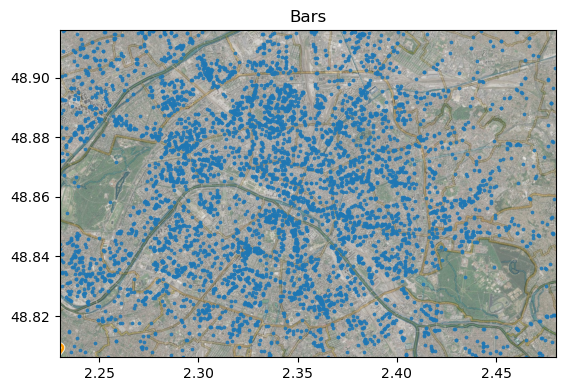

In [35]:
# bar
data_bar, notes = load_poi("bar")

show_img()
plt.scatter(data_bar[:,0],data_bar[:,1],alpha=0.8,s=3)
plt.title('Bars')
plt.show()

In [42]:
# noyau uniforme
ku = KernelDensity(kernel_uniform)
ku.fit(data_bar)

In [43]:
get_density2D(ku, data_bar, 10)[0].sum()

2501.043371522094

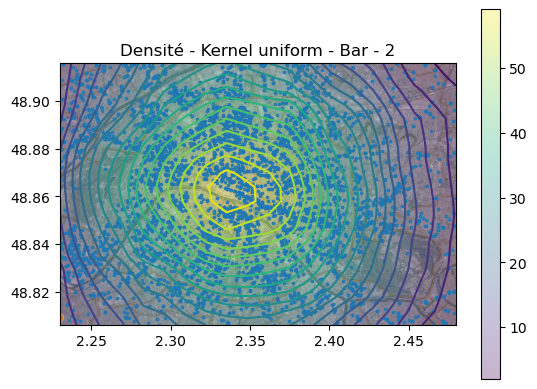

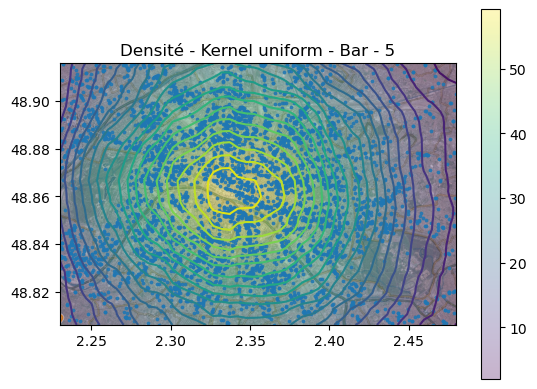

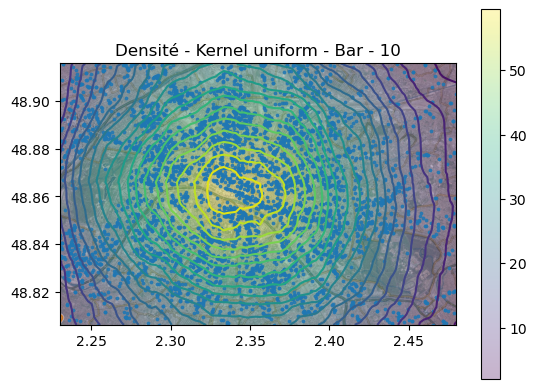

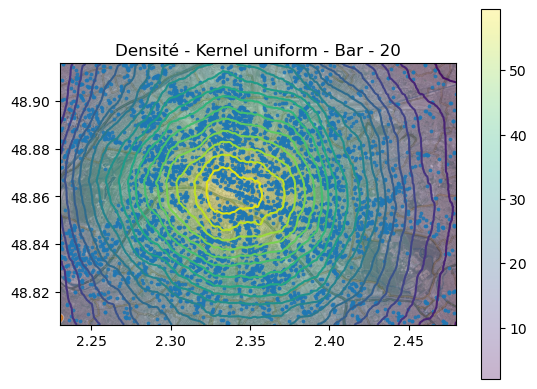

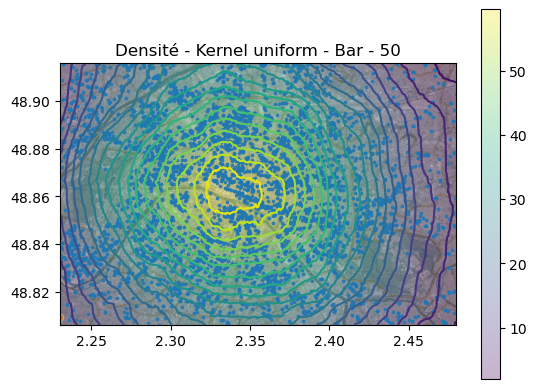

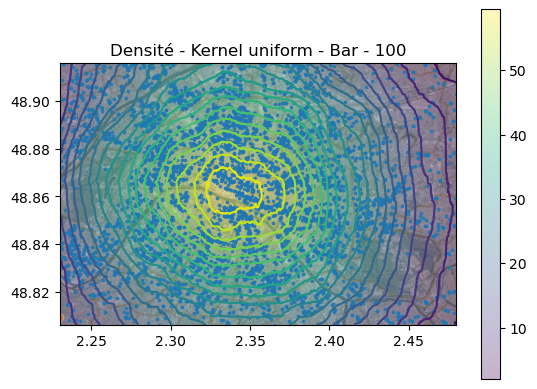

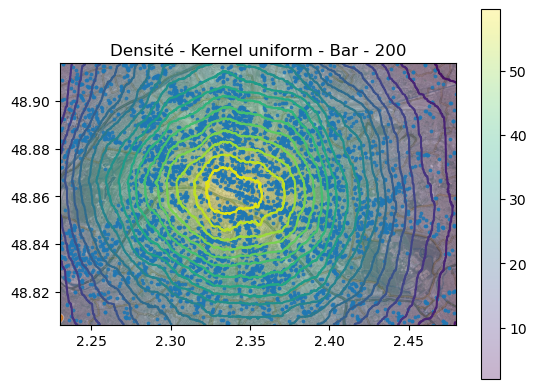

In [44]:
for steps in [2, 5, 10, 20, 50, 100, 200]:
    ku = KernelDensity(kernel_uniform)
    ku.fit(data_bar)
    show_density(ku, data_bar, steps * 10)
    plt.title(f'Densité - Kernel uniform - Bar - {steps}')

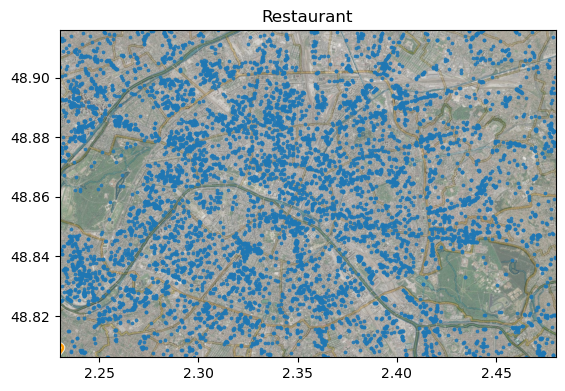

In [45]:
data_resto, notes = load_poi("restaurant")

show_img()
plt.scatter(data_resto[:,0],data_resto[:,1],alpha=0.8,s=3)
plt.title('Restaurant')
plt.show()

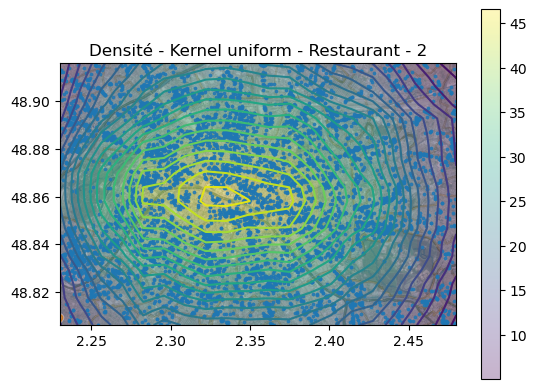

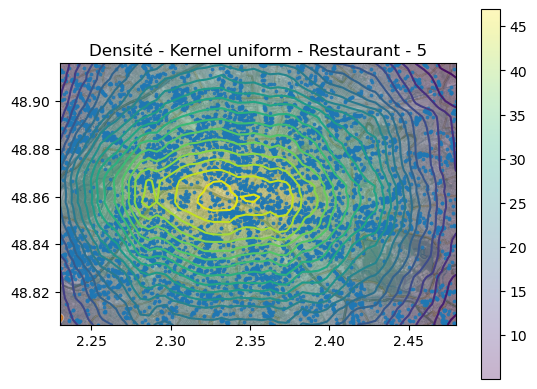

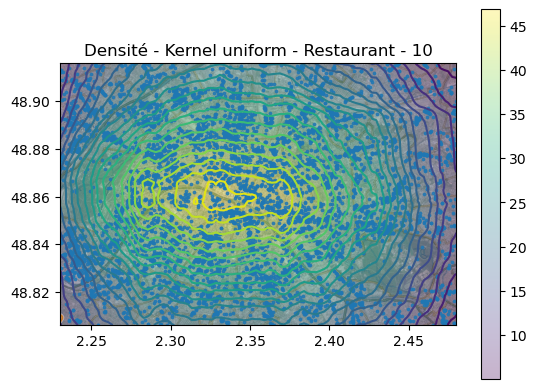

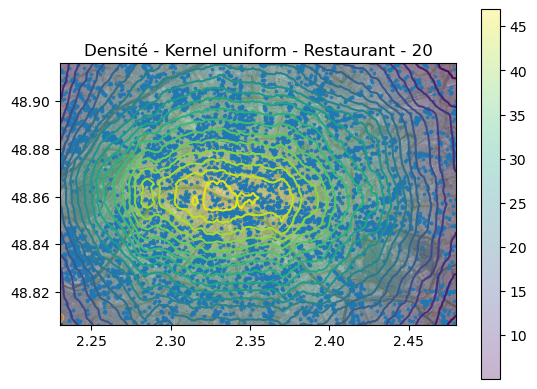

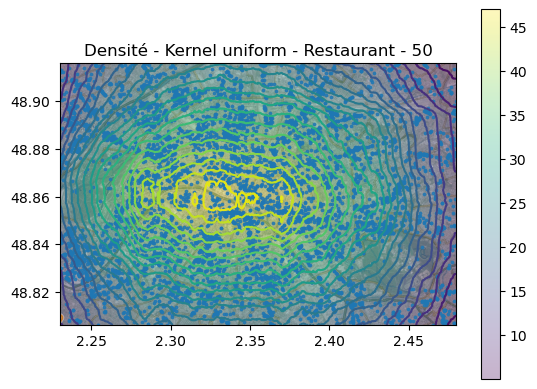

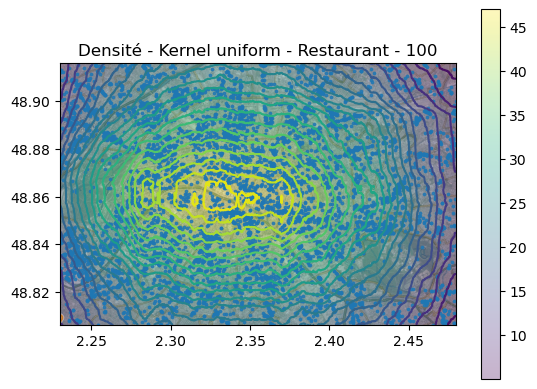

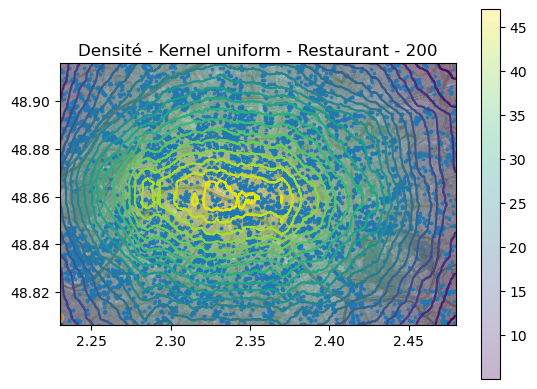

In [46]:
for steps in [2, 5, 10, 20, 50, 100, 200]:
    ku = KernelDensity(kernel_uniform)
    ku.fit(data_resto)
    show_density(ku, data_resto, steps * 10)
    plt.title(f'Densité - Kernel uniform - Restaurant - {steps}')

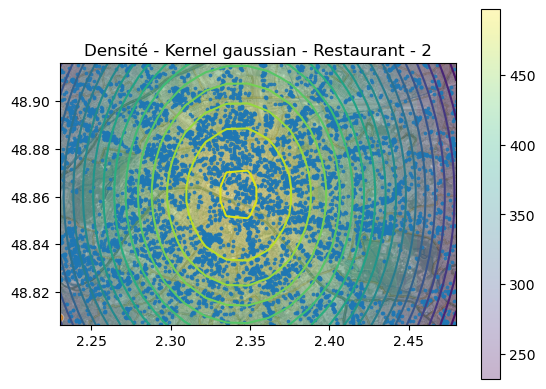

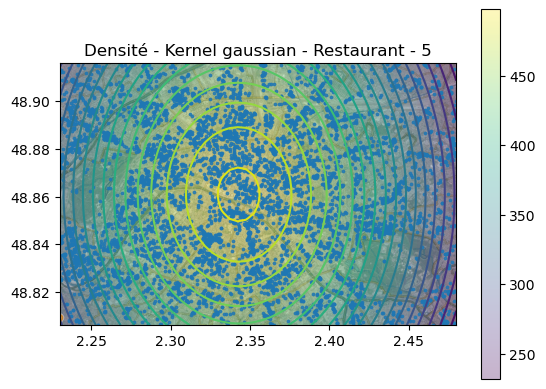

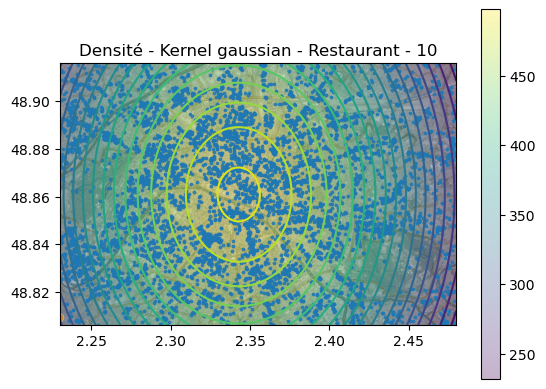

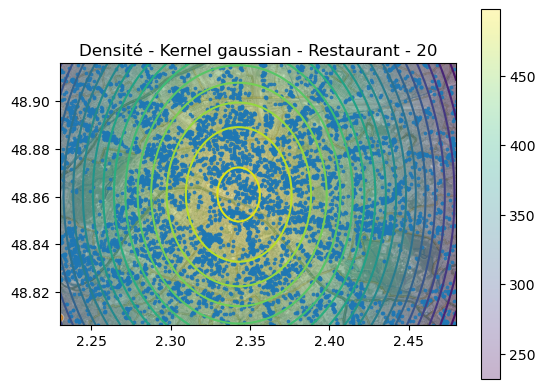

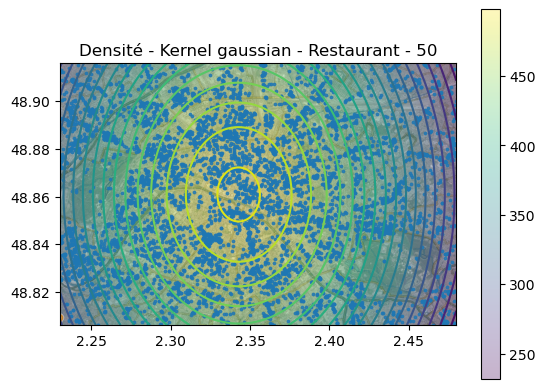

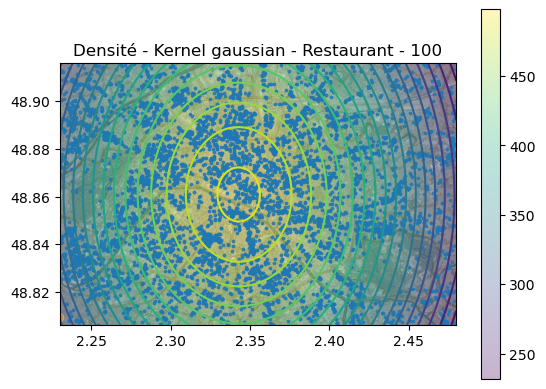

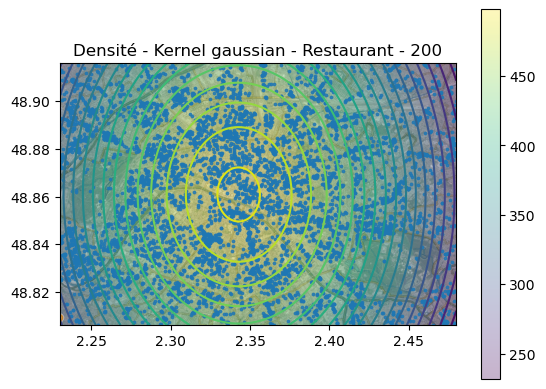

In [47]:
# noyau gaussien
for steps in [2, 5, 10, 20, 50, 100, 200]:
    kg = KernelDensity(kernel_gaussian)
    kg.fit(data_resto)
    show_density(kg, data_resto, steps * 10)
    plt.title(f'Densité - Kernel gaussian - Restaurant - {steps}')

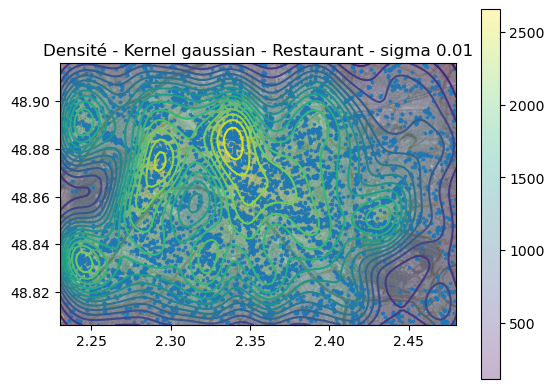

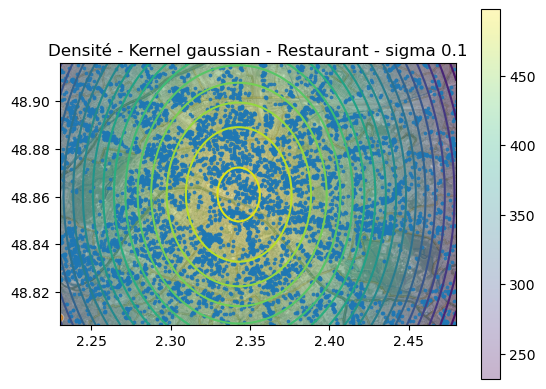

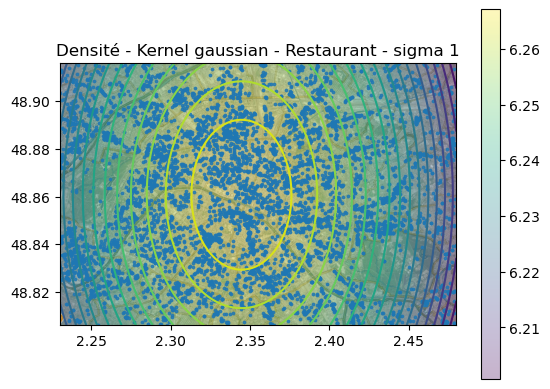

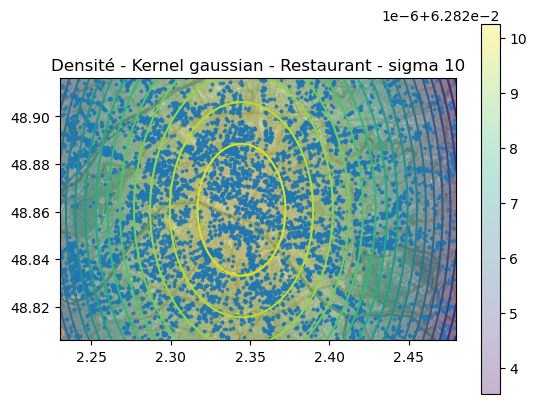

In [48]:
for sigma in [0.01, 0.1, 1, 10]:
    steps = 10
    kg = KernelDensity(kernel_gaussian, sigma)
    kg.fit(data_resto)
    show_density(kg, data_resto, steps * 10)
    plt.title(f'Densité - Kernel gaussian - Restaurant - sigma {sigma}')

In [62]:
def cross_validation_kernel(data, kernel, sigmas=[], size=.2, cv=5, log=False):
    N = len(data)

    mean_scores = []
    std_scores = []
    
    for sigma in sigmas:
        if log: print('Sigma :', sigma)
        
        test_scores = []
        
        for i in range(cv):
                
            index = np.arange(0, N)
            np.random.shuffle(index)
            
            test_zize = int(N * size)
            test = index[:test_zize]
            train = index[test_zize:]
        
            k = KernelDensity(kernel, sigma)
            k.fit( data[train] )
            
            test_scores.append( k.score( data[test] ) )
        
        mean = np.mean(test_scores)
        std = np.std(test_scores)
        
        if log:
            print('\tMean :', mean)
            print('\tStd :', std)
        
        mean_scores.append(mean)
        std_scores.append(std)
        
    return mean_scores, std_scores

In [66]:
sigmas = np.arange(0.1, 1.1, 0.1)

print('Kernel uniform')
mean_scores, std_scores = cross_validation_kernel(data_bar, kernel_uniform, sigmas, log=True)

print('\nMeilleure valeur de sigma :', sigmas[np.argmin(mean_scores)])

Kernel uniform
Sigma : 0.1
	Mean : 3432.386056526051
	Std : 16.820039437853076
Sigma : 0.2
	Mean : 2889.8575267839237
	Std : 3.4939832399723687
Sigma : 0.30000000000000004
	Mean : 2296.9724370330423
	Std : 1.6425218188812456
Sigma : 0.4
	Mean : 1783.4992876098597
	Std : 0.5082978858567407
Sigma : 0.5
	Mean : 1354.4095908385584
	Std : 0.0
Sigma : 0.6
	Mean : 998.1532688739175
	Std : 0.0
Sigma : 0.7000000000000001
	Mean : 696.9428405041558
	Std : 0.0
Sigma : 0.8
	Mean : 436.0224993304939
	Std : 0.0
Sigma : 0.9
	Mean : 205.87444767452934
	Std : 0.0
Sigma : 1.0
	Mean : 9.770000807884928e-08
	Std : 0.0

Meilleure valeur de sigma : 1.0


In [67]:
sigmas = np.arange(0.1, 1.1, 0.1)

print('Kernel gaussian')
mean_scores, std_scores = cross_validation_kernel(data_bar, kernel_gaussian, sigmas, log=True)

print('\nMeilleure valeur de sigma :', sigmas[np.argmin(mean_scores)])

Kernel gaussian
Sigma : 0.1
	Mean : 5978.61140434854
	Std : 5.098806487420514
Sigma : 0.2
	Mean : 4851.210363437816
	Std : 0.33495015683695756
Sigma : 0.30000000000000004
	Mean : 4107.632914357872
	Std : 0.5194484950633326
Sigma : 0.4
	Mean : 3563.18921371952
	Std : 0.14396813338036554
Sigma : 0.5
	Mean : 3135.3261105701886
	Std : 0.1126800166919617
Sigma : 0.6
	Mean : 2783.4891166347775
	Std : 0.13430885592982086
Sigma : 0.7000000000000001
	Mean : 2485.0038054707175
	Std : 0.06117739308950792
Sigma : 0.8
	Mean : 2225.806173978409
	Std : 0.04192491168320285
Sigma : 0.9
	Mean : 1996.8972550706353
	Std : 0.03868130265746906
Sigma : 1.0
	Mean : 1791.901069581938
	Std : 0.03957935490446112

Meilleure valeur de sigma : 1.0


## IV. Régression par Nadaraya-Watson

L’estimateur de Nadaraya-Watson permet de faire de la classification et de la régression en utilisant une
méthode très similaires aux méthodes à noyaux. Soit un ensemble d’apprentissage : $\{ x_i, y_i \} i=1..N \in R^d x R$

**Codez la classe Nadaraya** correspondant à cet estimateur. Testez votre implémentation pour prédire la note d’un POI en fonction de son emplacement. Faites varier le paramètrage et mesurez les performances en utilisant l’erreur aux moindres carrés.

In [49]:
class NadarayaWatsonEstimator(object):
    def __init__(self, kernel, sigma=0.01):
        self.kernel = kernel
        self.sigma = sigma
        
    def fit(self, X, y):
        self.X = X
        self.y = y
        
    def f(self, x0):
        x_x0 = (self.X - x0) / self.sigma
        phi = self.kernel(x_x0)
        yi_phi = self.y * phi
        yi_phi_ratio = yi_phi / phi.sum()
        return yi_phi_ratio.sum()
        
    def predict(self, data):
        return np.array([self.f(x0) for x0 in data])

In [50]:
def mse(y, y_pred):
    return ((y-y_pred)**2).mean()

In [54]:
from sklearn.model_selection import train_test_split

X, y = load_poi("bar")
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.2)

print(X.shape, y.shape)
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(4888, 2) (4888,)
(3910, 2) (978, 2) (3910,) (978,)


In [58]:
nw = NadarayaWatsonEstimator(kernel_uniform)
nw.fit(X_train, y_train)
y_pred = nw.predict(X_test)
y_pred_nan = np.nan_to_num(y_pred, nan=0)
mse(y_test, y_pred_nan)

/var/folders/94/mh6g2gbj3bl342zd3jjfff0c0000gn/T/ipykernel_70894/3264253440.py:14: RuntimeWarning: invalid value encountered in true_divide
  yi_phi_ratio = yi_phi / phi.sum()


3.6606617544821636

In [59]:
nw = NadarayaWatsonEstimator(kernel_gaussian)
nw.fit(X_train, y_train)
y_pred = nw.predict(X_test)
y_pred_nan = np.nan_to_num(y_pred, nan=0)
mse(y_test, y_pred_nan)

3.431070681354447

In [61]:
sigmas = [0.01, 0.1, 1, 10, 100]
mses = []

for sigma in sigmas:
    nw = NadarayaWatsonEstimator(kernel_gaussian, sigma)
    nw.fit(X_train, y_train)
    y_pred = nw.predict(X_test)
    y_pred_nan = np.nan_to_num(y_pred, nan=0)
    m = mse(y_test, y_pred_nan)
    mses.append(m)
    
mses

[3.431070681354447,
 3.5799771044098647,
 3.592124889222253,
 3.592241306431626,
 3.5922424704214673]